In [34]:
import torch
import torch.nn as nn
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
from torchvision import transforms
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

In [35]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


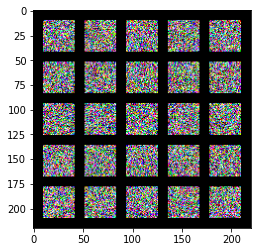

In [36]:
def get_random_img(batch_size, channel, height, weight):
    imgs = torch.randn(batch_size, channel, height, weight)
    return imgs
def show_tensor_images(image_tensor, num_images=25):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], padding = 10, nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()
imgs = get_random_img(128, 3, 32, 32)
show_tensor_images(imgs)

In [37]:
batch_size = 128
channel = 100
height = 1
weight = 1
imgs = get_random_img(batch_size, channel, height, weight)
print(imgs.shape)
#show_tensor_images(imgs)
transpose_conv = nn.ConvTranspose2d(channel, 1024, kernel_size = 4, stride = 1)
imgs_ = transpose_conv(imgs)
print(imgs_.shape)
#show_tensor_images(imgs_)

torch.Size([128, 100, 1, 1])
torch.Size([128, 1024, 4, 4])


In [38]:
class Generator(nn.Module):
    def __init__(self, z_dim, im_channel = 1, hidden_dim = 64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        self.gen = nn.Sequential(
            self.get_generator_block(z_dim, hidden_dim * 4),
            self.get_generator_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.get_generator_block(hidden_dim * 2, hidden_dim),
            self.get_generator_block(hidden_dim, im_channel, kernel_size=4, final_layer=True),
        )
    def get_generator_block(self, input_channel, output_channel, kernel_size = 3, stride = 2, final_layer = False):
        
        
        if not final_layer:
            return nn.Sequential(
            nn.ConvTranspose2d(input_channel, output_channel, kernel_size = kernel_size, stride=stride),
            nn.BatchNorm2d(output_channel),
            nn.ReLU(inplace = True)
            )
        else:
            return nn.Sequential(
            nn.ConvTranspose2d(input_channel, output_channel, kernel_size = kernel_size, stride = stride),
            nn.Tanh()
            )
 
    def forward(self, noise):
        x = self.unsqueeze_noise(noise)
        return self.gen(x)
    def unsqueeze_noise(self, noise):
        
        return noise.view(len(noise), self.z_dim, 1, 1)
def get_noise(num_samples, z_dim, device = "cpu"):
    return torch.randn(num_samples, z_dim, device = device)

In [39]:
batch_size = 128
z_dim = 64
noise = get_noise(batch_size, z_dim, device)
print(noise.shape)
gen = Generator(z_dim, 1, 16).to(device)
noise = gen.unsqueeze_noise(noise)
model = gen.get_generator_block(z_dim, 16*4).to(device)
s = model(noise)
s.shape

torch.Size([128, 64])


torch.Size([128, 64, 3, 3])

torch.Size([128, 1, 28, 28])


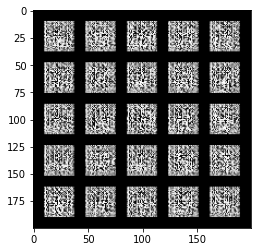

In [40]:
gen = Generator(64, 1, hidden_dim=64).to(device)
noise = get_noise(batch_size, z_dim = 64, device = device)
fake = gen(noise)
print(fake.shape)
show_tensor_images(fake)

In [41]:
class Discriminator(nn.Module):
    def __init__(self, im_channel = 1, hidden_dim = 16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.get_discriminator_block(im_channel, hidden_dim),
            self.get_discriminator_block(hidden_dim, hidden_dim * 2),
            self.get_discriminator_block(hidden_dim * 2, 1, final_layer=True),
        )
    def get_discriminator_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        
        if not final_layer:
            return nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            nn.BatchNorm2d(output_channels),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )
        else:
            return nn.Sequential(
            nn.Conv2d(input_channels, output_channels, kernel_size, stride)
            )
    def forward(self, img):
        pred = self.disc(img)
        return pred.view(len(pred), -1)

In [42]:
img = get_random_img(batch_size = 128, channel = 1, height = 28, weight = 28)
disc = Discriminator(im_channel=1, hidden_dim=64)
disc_output = disc(img)
print(disc_output.shape)

torch.Size([128, 1])


In [43]:
def get_data(batch_size = 128):
    # You can tranform the image values to be between -1 and 1 (the range of the tanh activation)
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,)),
    ])
    dataloader = DataLoader(FashionMNIST(".", download=True, transform=transform), batch_size = batch_size, shuffle=True)
    return dataloader

## Training

In [44]:
criterion = nn.BCEWithLogitsLoss()
batch_size = 128
lr = 0.0002
z_dim = 64
display_step = 200
beta1 = 0.5
beta2 = 0.999

dataloader = get_data(batch_size)


  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/train-images-idx3-ubyte.gz to ./FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting ./FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./FashionMNIST/raw



In [45]:
gen = Generator(z_dim=z_dim).to(device)
gen_opt = torch.optim.Adam(params = gen.parameters(), lr = lr, betas= (beta1, beta2))

disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(params= disc.parameters(), lr = lr, betas=(beta1, beta2))



In [46]:
isinstance(2, int) # verilen objenin class kontrolunu yapiyor

True

In [47]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, mean=0.0, std=0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, mean = 0.0, std = 0.02)
        torch.nn.init.constant_(m.bias, 0)
        

In [48]:
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)


In [49]:
for i in tqdm(range(1000)):
    pass

  0%|          | 0/1000 [00:00<?, ?it/s]

In [50]:
def get_disc_loss(gen, disc, real_imgs, z_dim, batch_size, criterion, get_noise = get_noise, device = "cpu"):
    
    
    noise = get_noise(batch_size, z_dim, device)
    fake = gen(noise)
    pred_fake = disc(fake.detach()) # burada disc tarafinda generator tarafi icin gradient degerlerini hesaplamak gereksiz
    target = torch.zeros_like(pred_fake)
    loss1 = criterion(pred_fake, target)
    
    pred_real = disc(real_imgs)
    target = torch.ones_like(pred_real)
    loss2 = criterion(pred_real, target)
    disc_loss = (loss1 + loss2) / 2
    return disc_loss

In [51]:
def get_gen_loss(gen, disc, z_dim, batch_size, criterion, get_noise = get_noise, device = "cpu"):
    
    noise = get_noise(batch_size, z_dim, device)
    fake = gen(noise)
    pred_fake = disc(fake)
    target = torch.ones_like(pred_fake)
    gen_loss = criterion(pred_fake, target)
    return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 0, step 200: Generator loss: 0.7155783236026769, discriminator loss: 0.6344372084736826


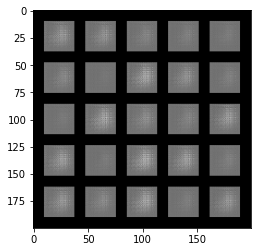

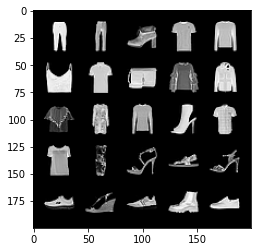

Epoch 0, step 400: Generator loss: 0.8938402733206747, discriminator loss: 0.4659126229584219


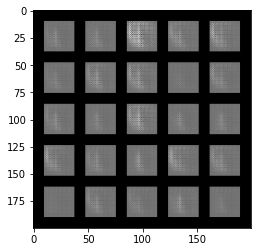

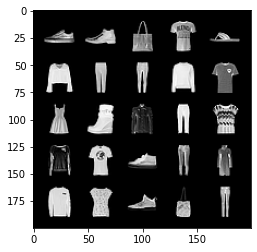

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 1, step 600: Generator loss: 1.3993541720509537, discriminator loss: 0.26003507040441043


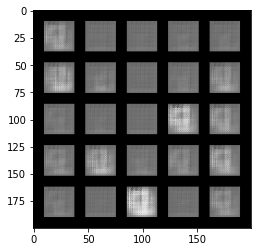

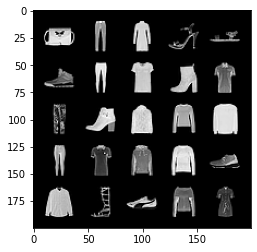

Epoch 1, step 800: Generator loss: 1.2823192501068124, discriminator loss: 0.5219696661084888


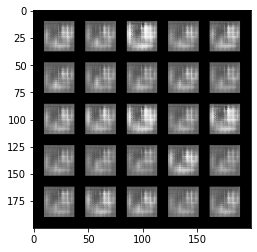

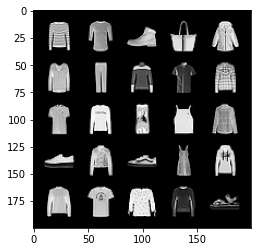

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 2, step 1000: Generator loss: 1.1370418120920658, discriminator loss: 0.5769135378301145


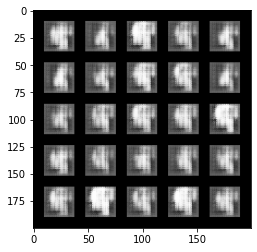

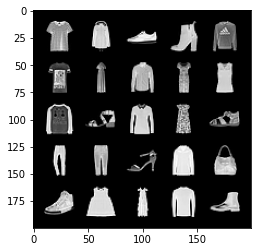

Epoch 2, step 1200: Generator loss: 1.1557249273359782, discriminator loss: 0.5368492086231709


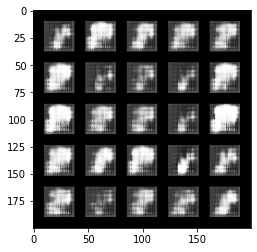

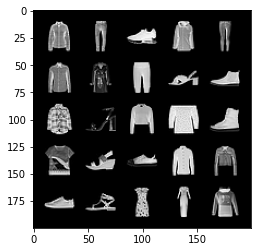

Epoch 2, step 1400: Generator loss: 1.1083454248309141, discriminator loss: 0.5795470303297042


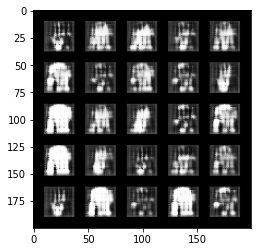

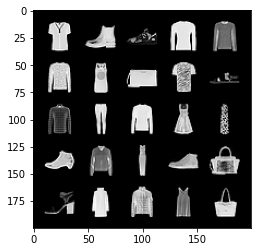

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 3, step 1600: Generator loss: 0.8596257178485395, discriminator loss: 0.6571729022264484


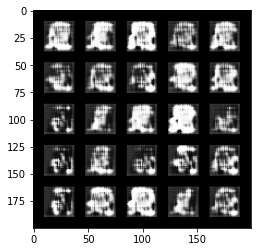

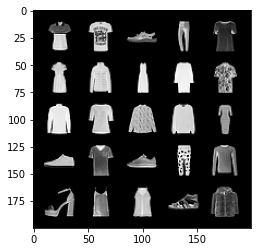

Epoch 3, step 1800: Generator loss: 0.8446056425571442, discriminator loss: 0.6388693702220916


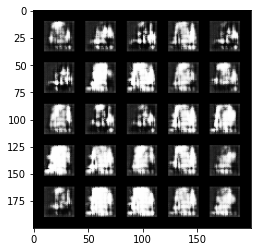

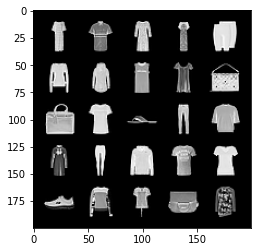

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 4, step 2000: Generator loss: 0.8072779482603071, discriminator loss: 0.6604232597351074


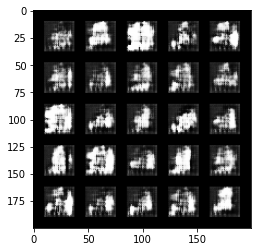

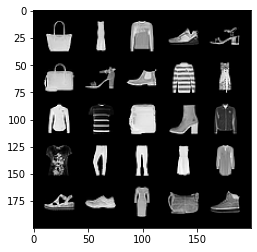

Epoch 4, step 2200: Generator loss: 0.7901636385917661, discriminator loss: 0.6575195974111561


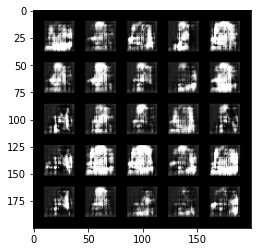

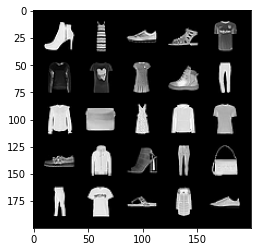

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 5, step 2400: Generator loss: 0.8111967465281485, discriminator loss: 0.6519881886243815


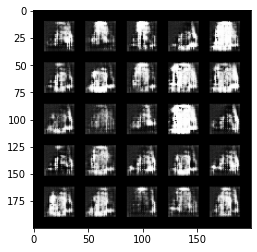

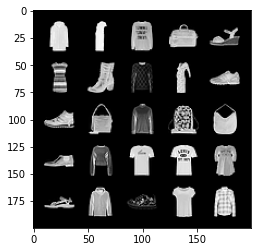

Epoch 5, step 2600: Generator loss: 0.8038591665029526, discriminator loss: 0.656170644760132


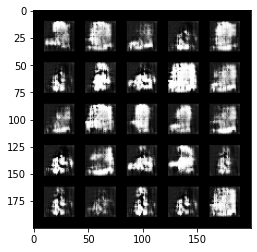

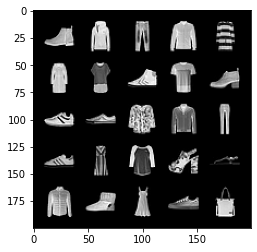

Epoch 5, step 2800: Generator loss: 0.7753198298811914, discriminator loss: 0.6600610616803163


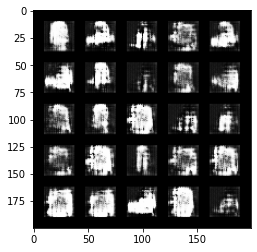

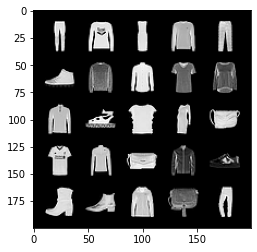

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 6, step 3000: Generator loss: 0.7556839811801904, discriminator loss: 0.667321400344372


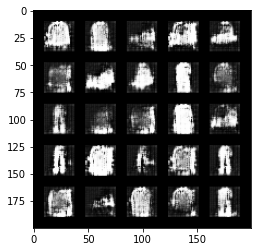

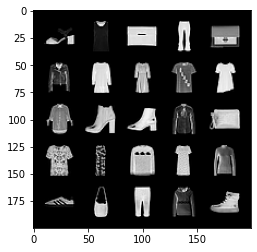

Epoch 6, step 3200: Generator loss: 0.7532783380150796, discriminator loss: 0.6730578398704528


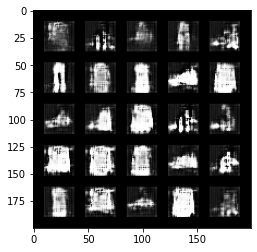

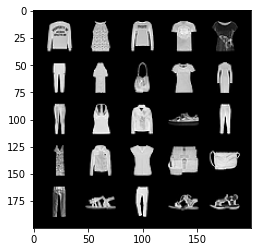

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 7, step 3400: Generator loss: 0.7442583820223808, discriminator loss: 0.6794127845764161


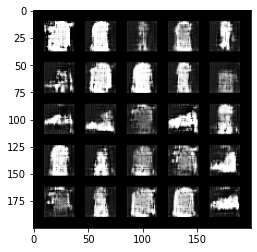

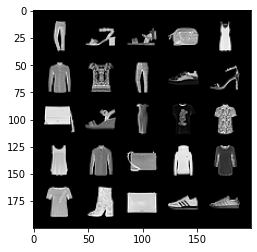

Epoch 7, step 3600: Generator loss: 0.7230569285154339, discriminator loss: 0.6837199366092682


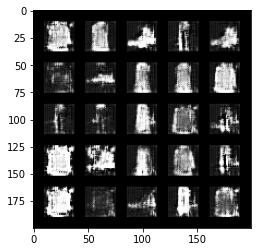

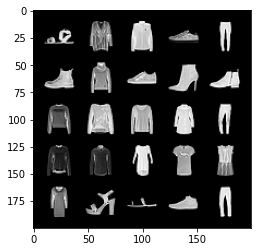

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 8, step 3800: Generator loss: 0.7164000400900838, discriminator loss: 0.689795021116733


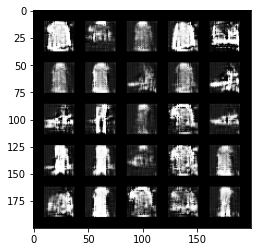

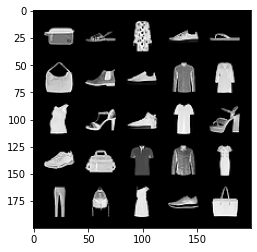

Epoch 8, step 4000: Generator loss: 0.7293378493189815, discriminator loss: 0.6877829661965372


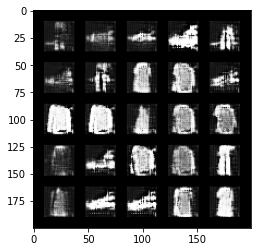

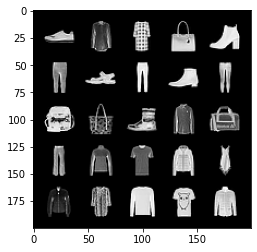

Epoch 8, step 4200: Generator loss: 0.7220648494362825, discriminator loss: 0.68588765501976


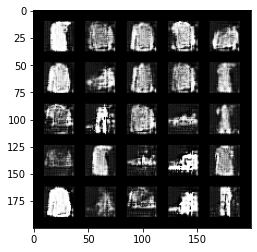

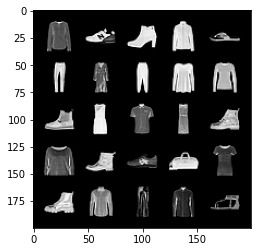

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 9, step 4400: Generator loss: 0.7136281326413156, discriminator loss: 0.6858631965517996


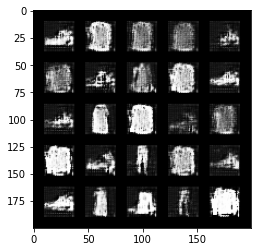

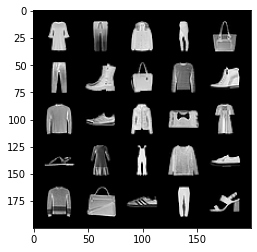

Epoch 9, step 4600: Generator loss: 0.716025248169899, discriminator loss: 0.6916850197315215


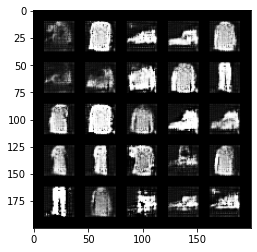

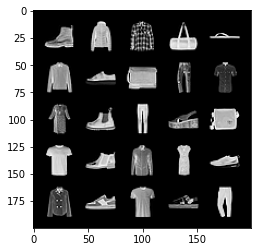

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 10, step 4800: Generator loss: 0.7111317631602285, discriminator loss: 0.6942570835351943


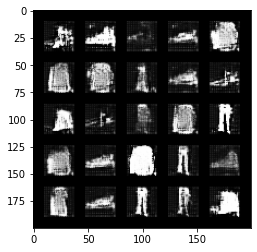

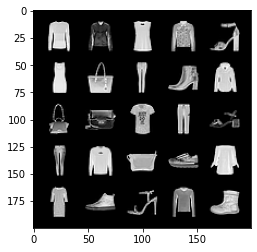

Epoch 10, step 5000: Generator loss: 0.7097691300511356, discriminator loss: 0.6964304387569427


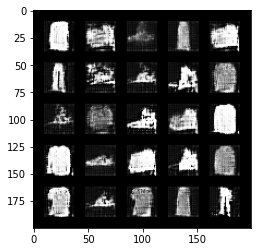

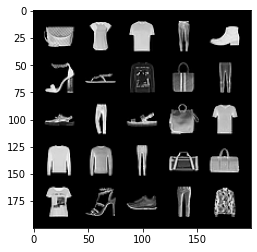

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 11, step 5200: Generator loss: 0.7026555845141411, discriminator loss: 0.696559180617333


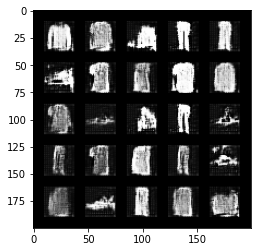

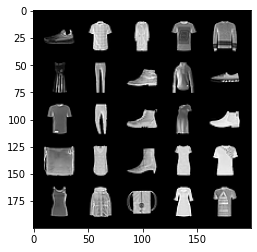

Epoch 11, step 5400: Generator loss: 0.6996122121810914, discriminator loss: 0.6974071317911148


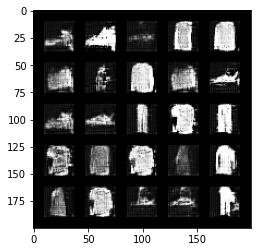

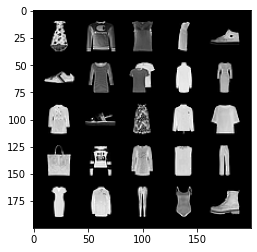

Epoch 11, step 5600: Generator loss: 0.6972072577476498, discriminator loss: 0.6986416265368461


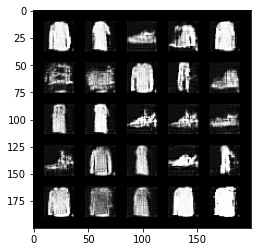

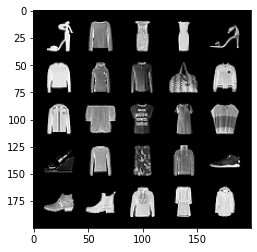

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 12, step 5800: Generator loss: 0.7015855485200883, discriminator loss: 0.7006038761138915


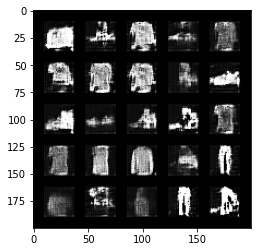

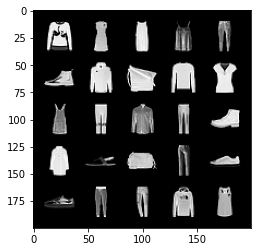

Epoch 12, step 6000: Generator loss: 0.6960390043258666, discriminator loss: 0.6984862014651301


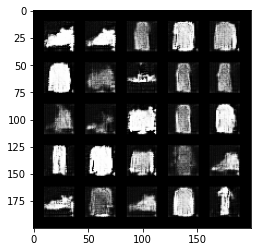

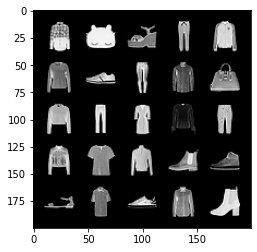

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 13, step 6200: Generator loss: 0.692844521701336, discriminator loss: 0.7000066310167311


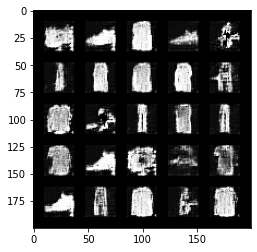

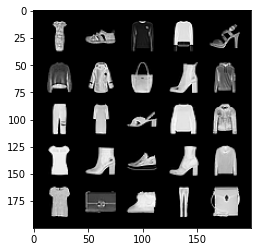

Epoch 13, step 6400: Generator loss: 0.6927899336814874, discriminator loss: 0.7004716894030573


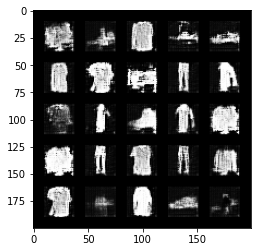

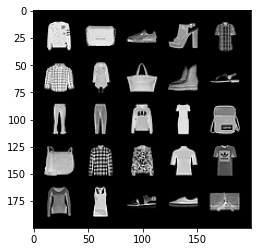

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 14, step 6600: Generator loss: 0.6945219063758853, discriminator loss: 0.7000272527337071


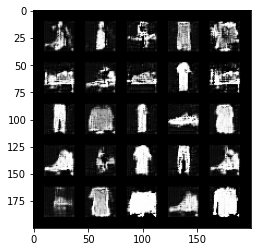

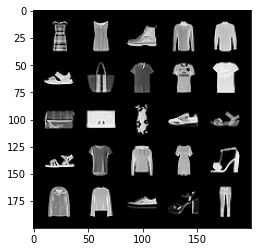

Epoch 14, step 6800: Generator loss: 0.6928653323650363, discriminator loss: 0.6999937644600867


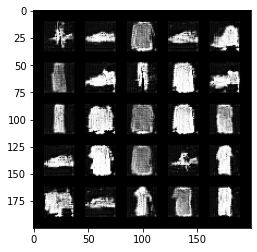

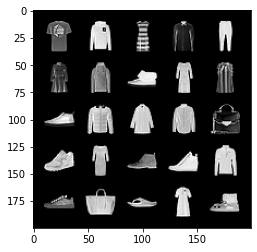

Epoch 14, step 7000: Generator loss: 0.6914989784359935, discriminator loss: 0.6998627325892445


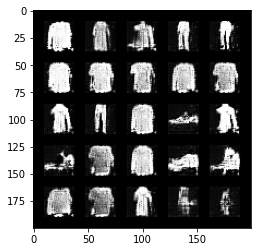

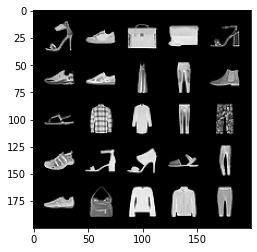

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 15, step 7200: Generator loss: 0.6946130430698398, discriminator loss: 0.6995745912194258


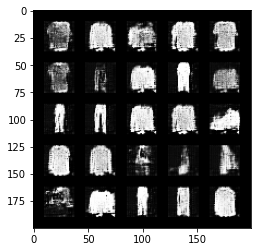

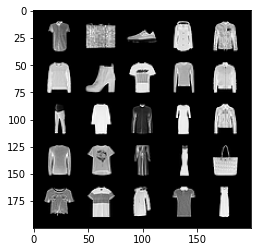

Epoch 15, step 7400: Generator loss: 0.6940578335523605, discriminator loss: 0.698827423155308


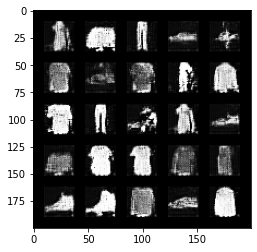

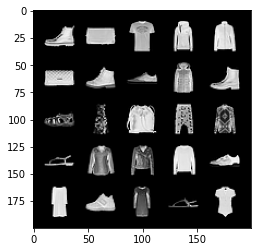

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 16, step 7600: Generator loss: 0.6934116965532303, discriminator loss: 0.6985170328617095


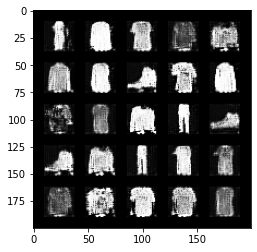

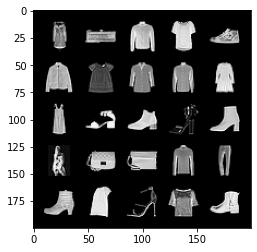

Epoch 16, step 7800: Generator loss: 0.693322157263756, discriminator loss: 0.6983811023831369


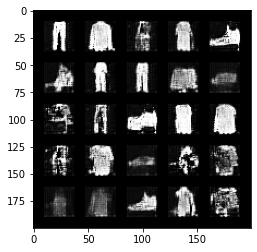

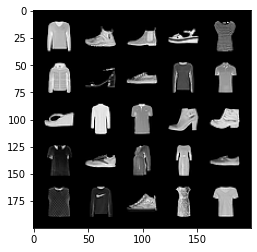

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 17, step 8000: Generator loss: 0.6934200039505956, discriminator loss: 0.6977495196461677


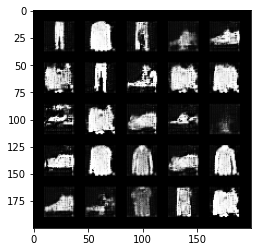

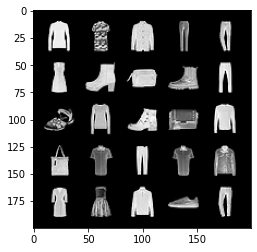

Epoch 17, step 8200: Generator loss: 0.6943003982305525, discriminator loss: 0.6978013038635256


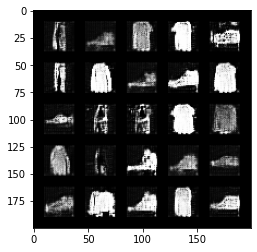

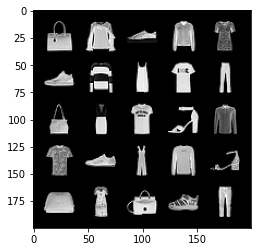

Epoch 17, step 8400: Generator loss: 0.6937076011300086, discriminator loss: 0.6976377835869787


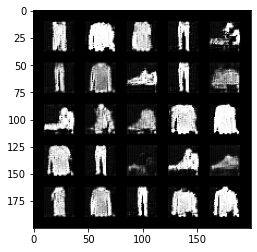

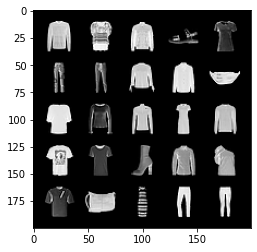

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 18, step 8600: Generator loss: 0.6926020714640616, discriminator loss: 0.6974018853902815


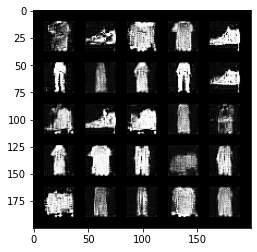

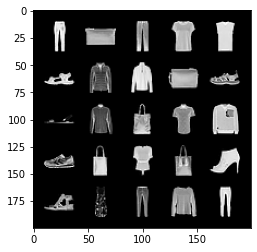

Epoch 18, step 8800: Generator loss: 0.6933434519171713, discriminator loss: 0.6971506646275522


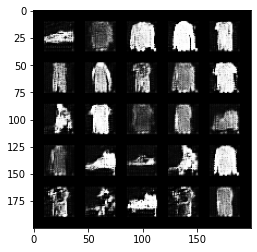

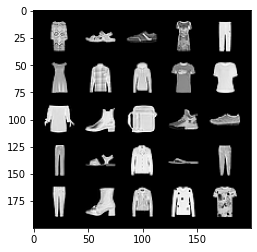

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 19, step 9000: Generator loss: 0.6945305132865904, discriminator loss: 0.6971870589256286


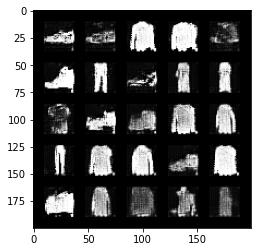

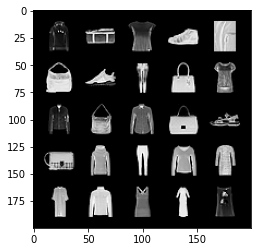

Epoch 19, step 9200: Generator loss: 0.6973447138071057, discriminator loss: 0.6966044458746913


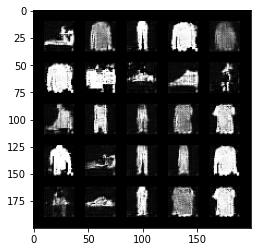

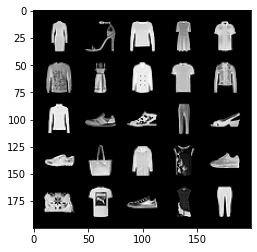

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 20, step 9400: Generator loss: 0.6944611877202994, discriminator loss: 0.696610631048679


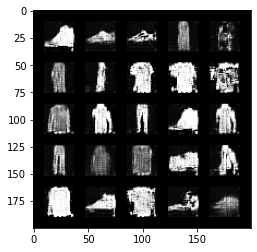

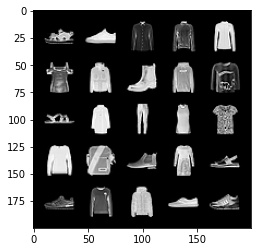

Epoch 20, step 9600: Generator loss: 0.6935504937171935, discriminator loss: 0.6963705977797507


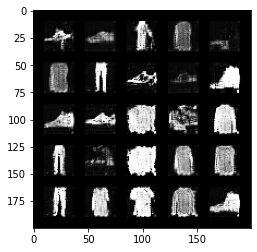

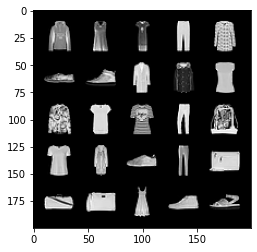

Epoch 20, step 9800: Generator loss: 0.6955510178208353, discriminator loss: 0.6966100579500201


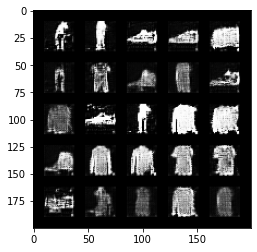

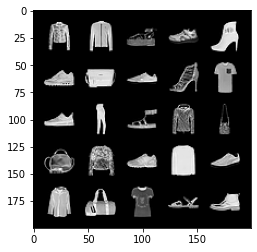

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 21, step 10000: Generator loss: 0.694908576607704, discriminator loss: 0.6962827453017231


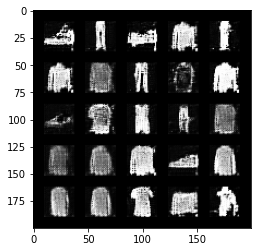

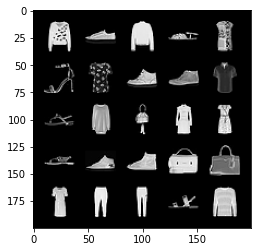

Epoch 21, step 10200: Generator loss: 0.6958729353547096, discriminator loss: 0.6961243072152137


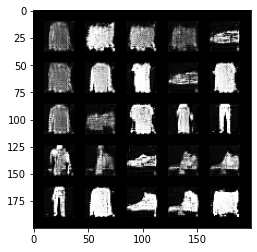

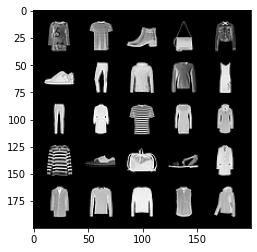

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 22, step 10400: Generator loss: 0.6930466219782832, discriminator loss: 0.6959360814094545


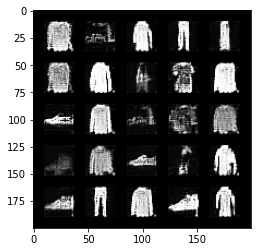

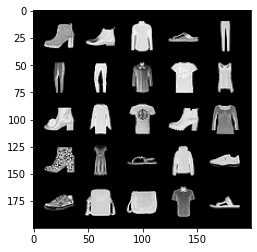

Epoch 22, step 10600: Generator loss: 0.6943964079022403, discriminator loss: 0.6960274821519856


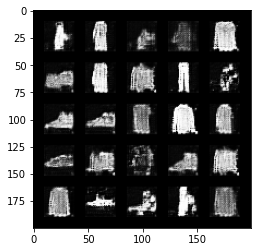

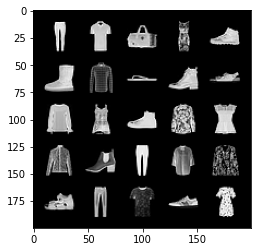

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 23, step 10800: Generator loss: 0.6948572137951851, discriminator loss: 0.6959263405203818


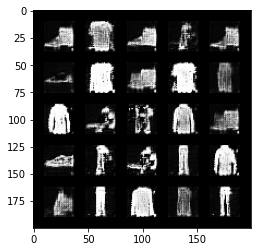

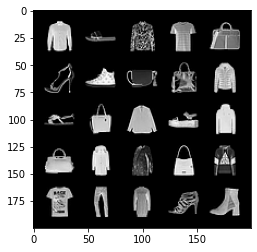

Epoch 23, step 11000: Generator loss: 0.6939815434813503, discriminator loss: 0.6957913109660147


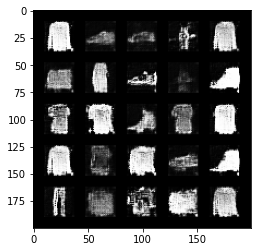

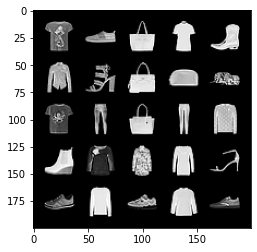

Epoch 23, step 11200: Generator loss: 0.6926862105727201, discriminator loss: 0.6956687149405479


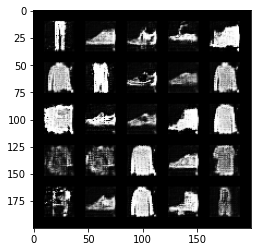

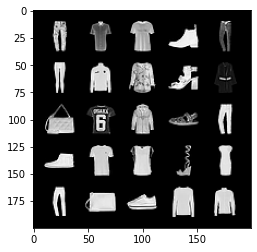

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 24, step 11400: Generator loss: 0.6937242707610132, discriminator loss: 0.695607696175576


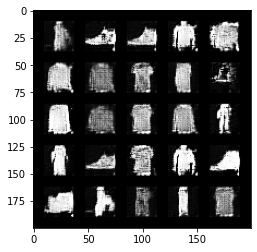

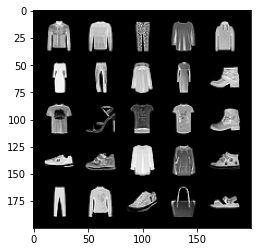

Epoch 24, step 11600: Generator loss: 0.6946696639060975, discriminator loss: 0.6955442076921463


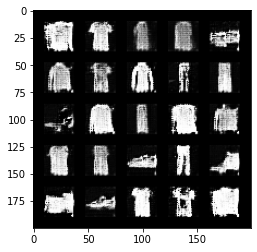

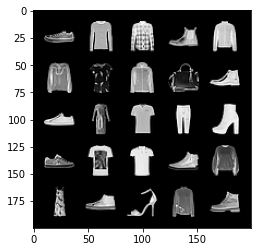

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 25, step 11800: Generator loss: 0.6942426443099975, discriminator loss: 0.6953278416395189


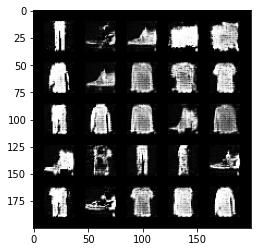

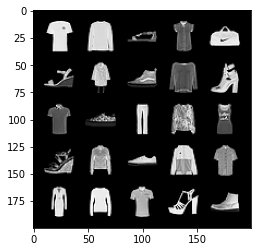

Epoch 25, step 12000: Generator loss: 0.6949780675768852, discriminator loss: 0.6953856155276298


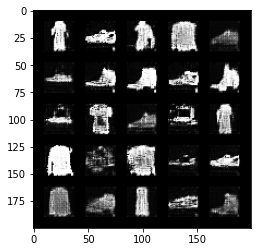

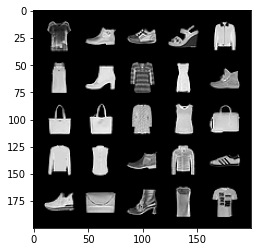

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 26, step 12200: Generator loss: 0.6938298112154008, discriminator loss: 0.6950277131795882


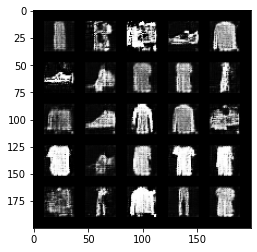

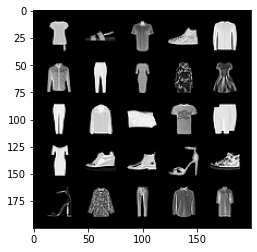

Epoch 26, step 12400: Generator loss: 0.6939683490991595, discriminator loss: 0.6949861824512477


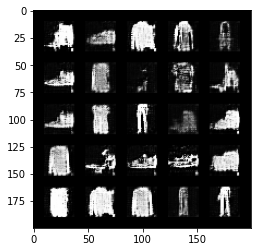

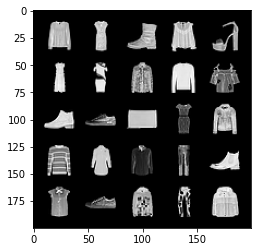

Epoch 26, step 12600: Generator loss: 0.6951201212406161, discriminator loss: 0.6949280849099155


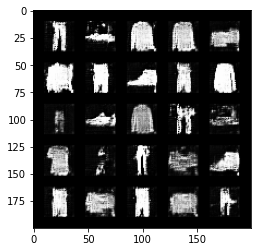

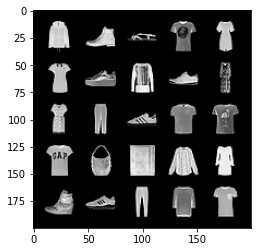

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 27, step 12800: Generator loss: 0.6945095860958098, discriminator loss: 0.694820040166378


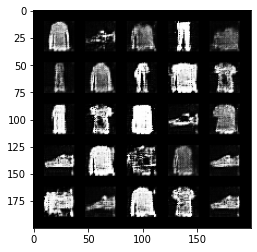

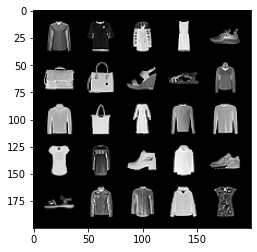

Epoch 27, step 13000: Generator loss: 0.6952233862876891, discriminator loss: 0.6948157936334612


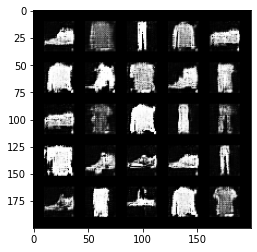

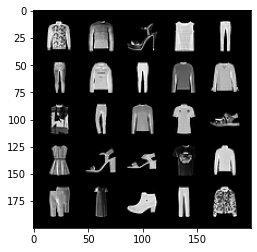

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 28, step 13200: Generator loss: 0.6936766326427459, discriminator loss: 0.6944852644205091


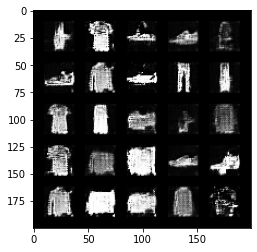

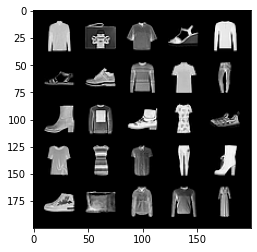

Epoch 28, step 13400: Generator loss: 0.6942209905385979, discriminator loss: 0.6946110251545901


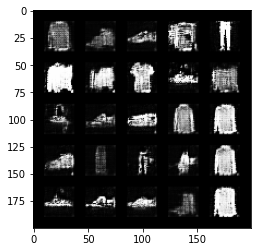

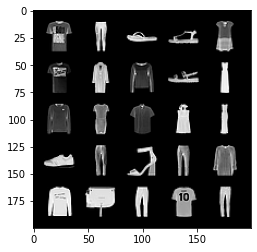

Epoch 28, step 13600: Generator loss: 0.696539248526096, discriminator loss: 0.6945809456706049


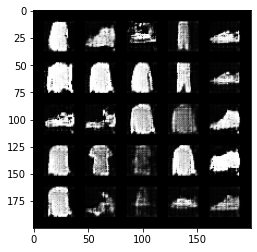

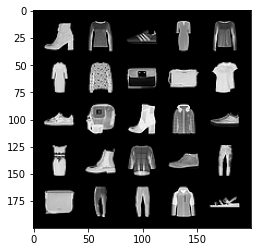

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 29, step 13800: Generator loss: 0.6957745087146757, discriminator loss: 0.69449727922678


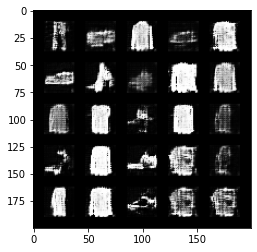

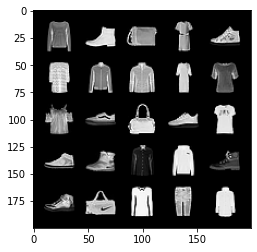

Epoch 29, step 14000: Generator loss: 0.6947833234071734, discriminator loss: 0.6944015869498248


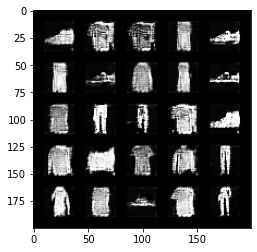

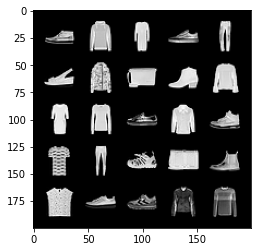

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 30, step 14200: Generator loss: 0.6957280442118647, discriminator loss: 0.6943141016364098


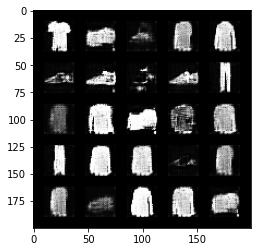

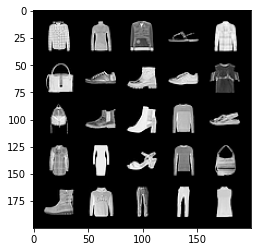

Epoch 30, step 14400: Generator loss: 0.6941440126299855, discriminator loss: 0.6941822323203092


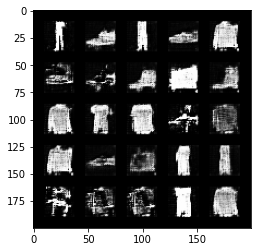

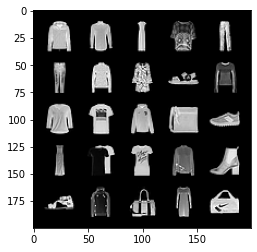

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 31, step 14600: Generator loss: 0.6942364090681076, discriminator loss: 0.6942689770460131


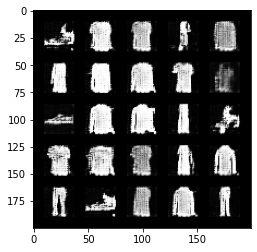

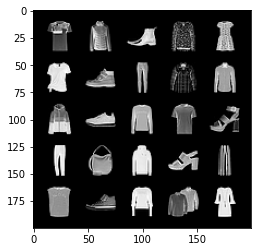

Epoch 31, step 14800: Generator loss: 0.6945125034451485, discriminator loss: 0.6942185306549075


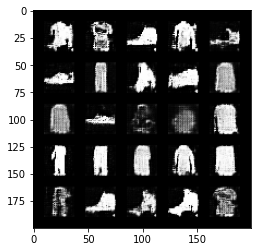

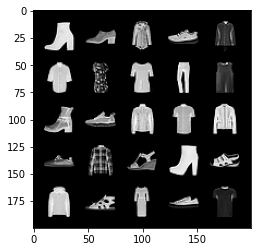

Epoch 31, step 15000: Generator loss: 0.6945097571611404, discriminator loss: 0.6942877048254013


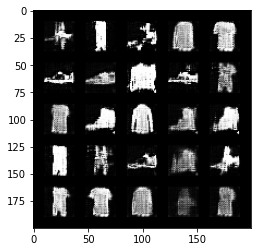

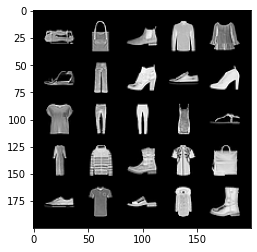

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 32, step 15200: Generator loss: 0.6952782097458838, discriminator loss: 0.6941607007384305


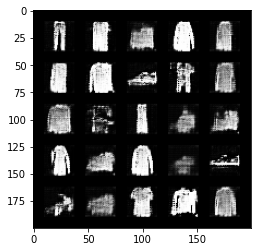

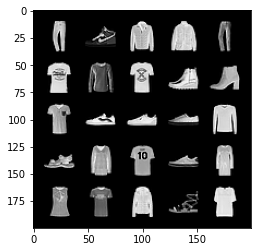

Epoch 32, step 15400: Generator loss: 0.6948642861843104, discriminator loss: 0.6941938695311547


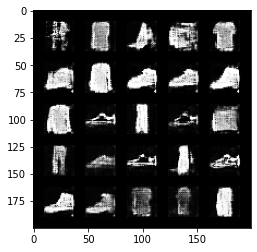

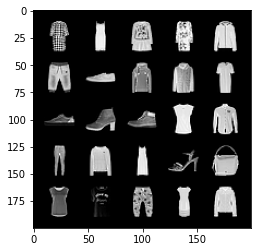

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 33, step 15600: Generator loss: 0.6955525639653205, discriminator loss: 0.6940456140041348


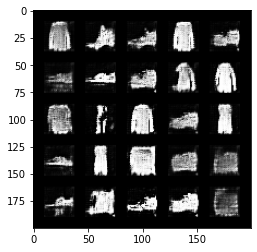

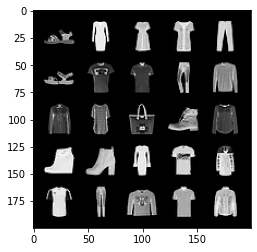

Epoch 33, step 15800: Generator loss: 0.6941611683368677, discriminator loss: 0.6940898138284678


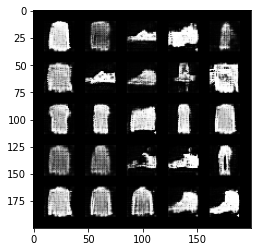

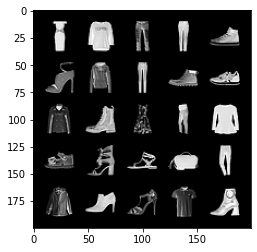

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 34, step 16000: Generator loss: 0.6954059627652173, discriminator loss: 0.6939432093501093


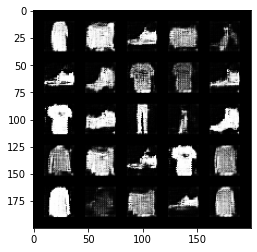

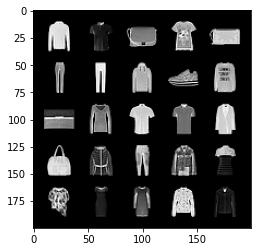

Epoch 34, step 16200: Generator loss: 0.6948763188719749, discriminator loss: 0.6941732177138328


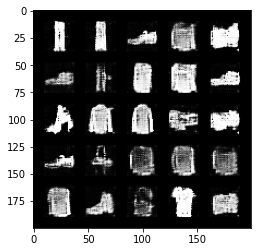

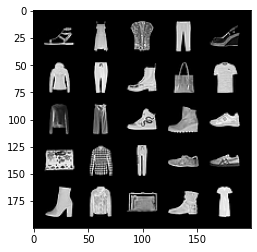

Epoch 34, step 16400: Generator loss: 0.6942055279016494, discriminator loss: 0.6938760057091707


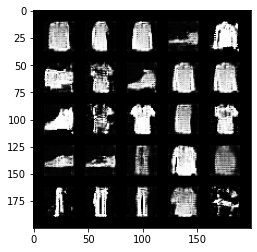

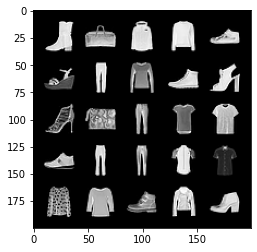

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 35, step 16600: Generator loss: 0.6940532124042509, discriminator loss: 0.694010951817036


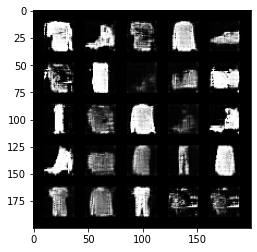

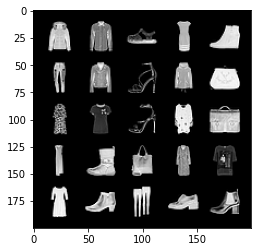

Epoch 35, step 16800: Generator loss: 0.6944898244738588, discriminator loss: 0.6940231889486314


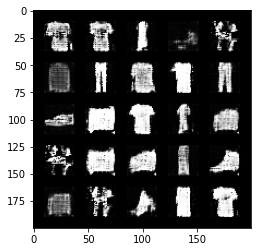

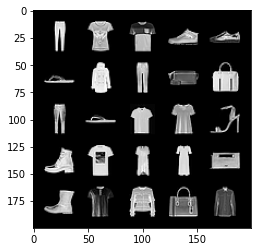

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 36, step 17000: Generator loss: 0.6936864781379702, discriminator loss: 0.6939834865927694


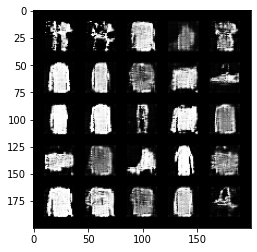

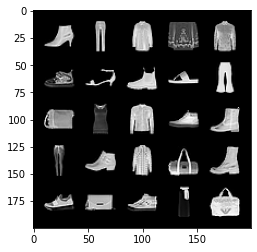

Epoch 36, step 17200: Generator loss: 0.6949175944924355, discriminator loss: 0.6939420765638351


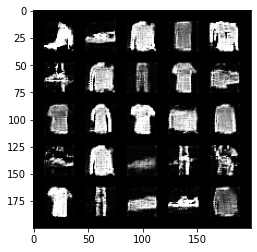

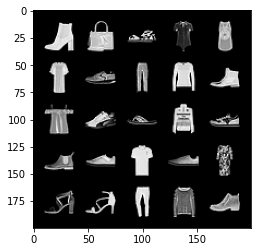

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 37, step 17400: Generator loss: 0.6939318907260892, discriminator loss: 0.6939936119318011


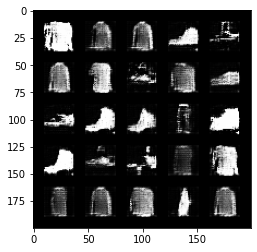

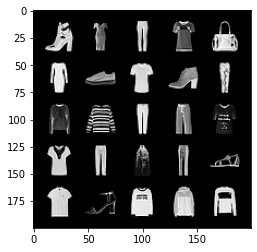

Epoch 37, step 17600: Generator loss: 0.6965653303265572, discriminator loss: 0.6938783317804331


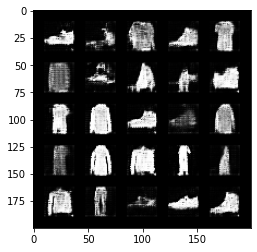

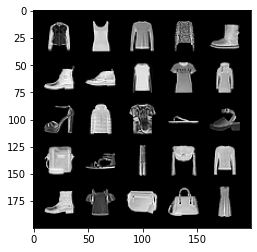

Epoch 37, step 17800: Generator loss: 0.6937217691540716, discriminator loss: 0.6936975347995759


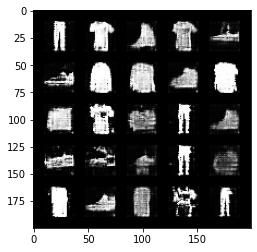

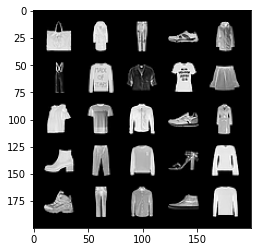

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 38, step 18000: Generator loss: 0.694459336698055, discriminator loss: 0.6938239464163782


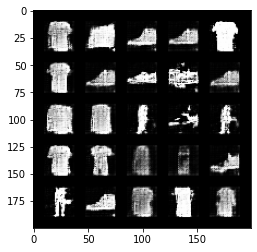

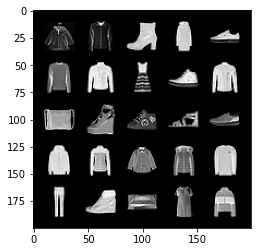

Epoch 38, step 18200: Generator loss: 0.6948840200901034, discriminator loss: 0.6936338198184965


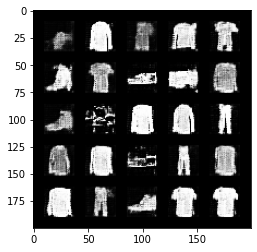

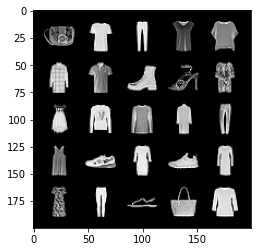

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 39, step 18400: Generator loss: 0.6938824659585953, discriminator loss: 0.6938763025403019


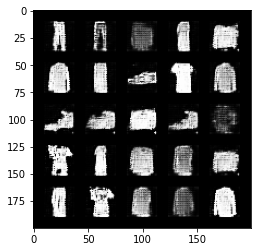

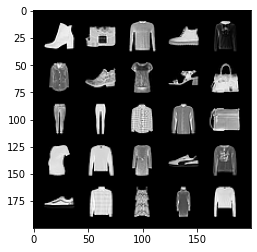

Epoch 39, step 18600: Generator loss: 0.6951806831359867, discriminator loss: 0.6938393890857698


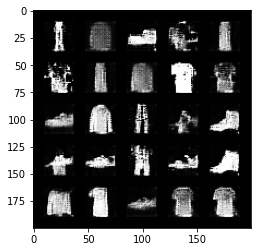

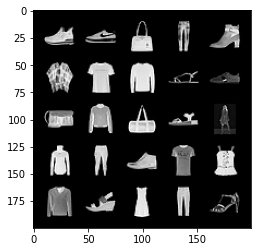

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 40, step 18800: Generator loss: 0.6951293668150899, discriminator loss: 0.6938217091560359


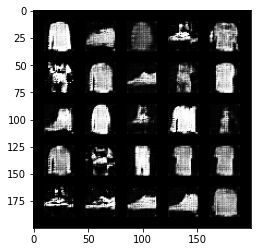

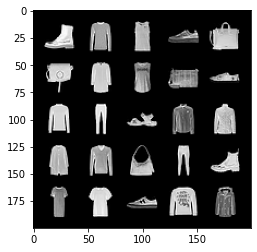

Epoch 40, step 19000: Generator loss: 0.6939546412229535, discriminator loss: 0.6936382633447649


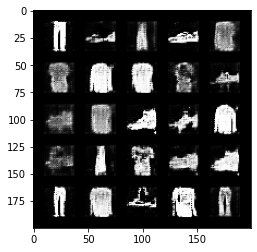

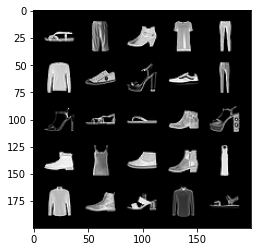

Epoch 40, step 19200: Generator loss: 0.6944727018475532, discriminator loss: 0.6936605966091154


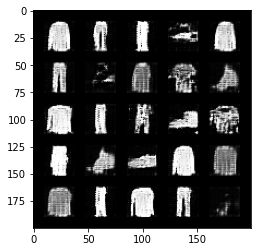

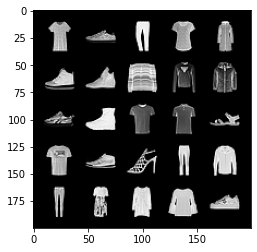

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 41, step 19400: Generator loss: 0.6943751066923145, discriminator loss: 0.6936621361970906


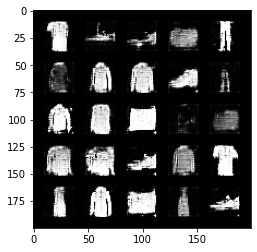

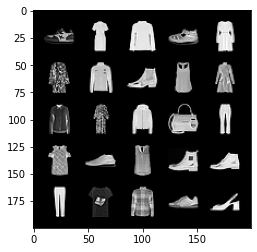

Epoch 41, step 19600: Generator loss: 0.6941812688112253, discriminator loss: 0.6937362688779832


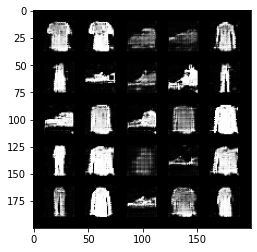

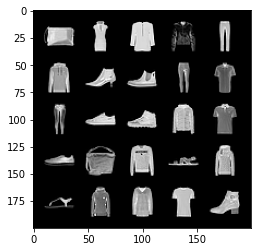

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 42, step 19800: Generator loss: 0.6959367889165873, discriminator loss: 0.6940726941823958


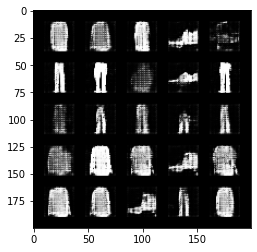

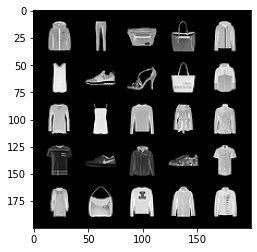

Epoch 42, step 20000: Generator loss: 0.6963113582134249, discriminator loss: 0.6933858302235603


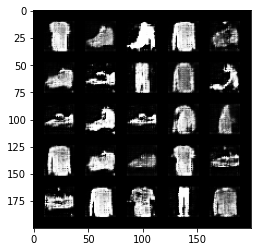

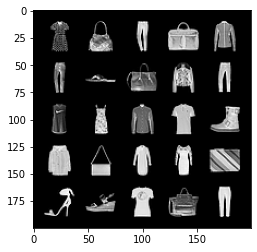

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 43, step 20200: Generator loss: 0.6943021804094309, discriminator loss: 0.6937155374884605


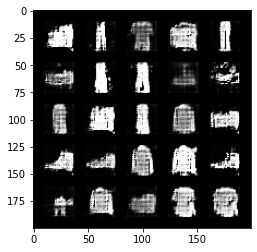

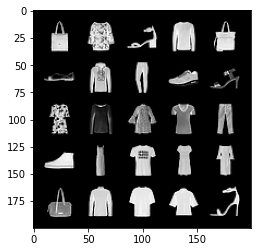

Epoch 43, step 20400: Generator loss: 0.6934819725155829, discriminator loss: 0.6937469655275342


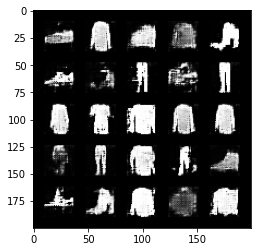

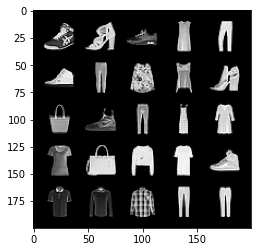

Epoch 43, step 20600: Generator loss: 0.6947733137011529, discriminator loss: 0.6937250041961668


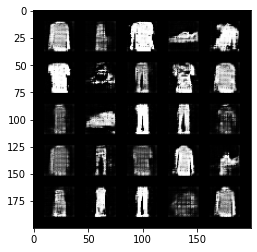

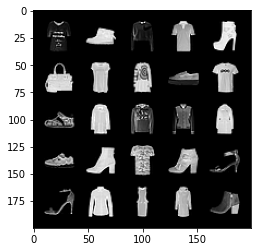

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 44, step 20800: Generator loss: 0.6945833933353427, discriminator loss: 0.6935320305824276


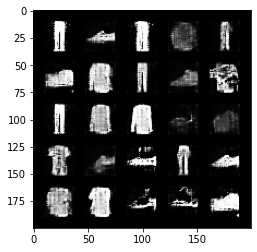

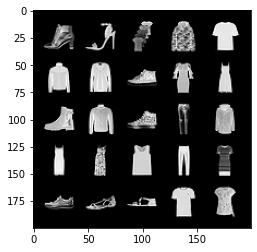

Epoch 44, step 21000: Generator loss: 0.6952374783158304, discriminator loss: 0.6934531822800641


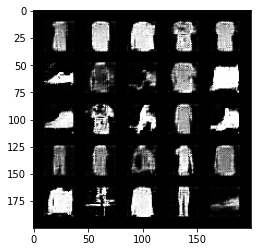

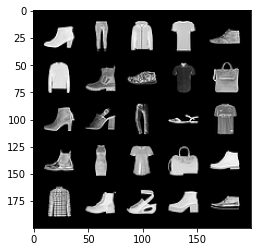

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 45, step 21200: Generator loss: 0.6939617493748669, discriminator loss: 0.6936234658956529


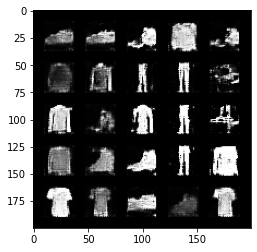

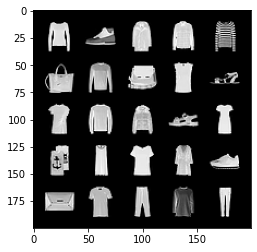

Epoch 45, step 21400: Generator loss: 0.6940149670839312, discriminator loss: 0.6935736456513403


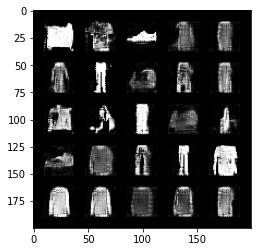

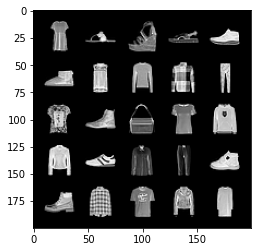

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 46, step 21600: Generator loss: 0.6940391093492513, discriminator loss: 0.6936278766393661


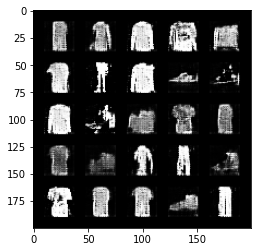

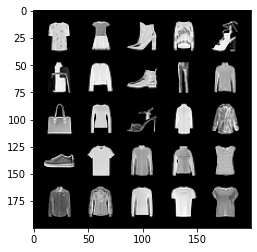

Epoch 46, step 21800: Generator loss: 0.6943298920989038, discriminator loss: 0.6935702088475231


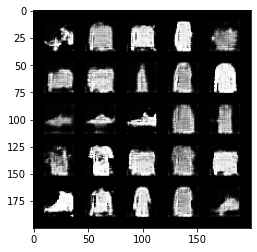

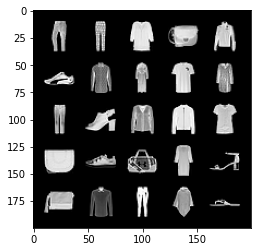

Epoch 46, step 22000: Generator loss: 0.6937176522612571, discriminator loss: 0.6935402700304985


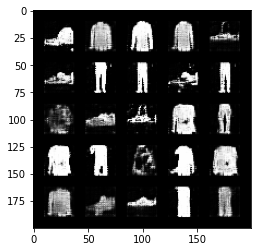

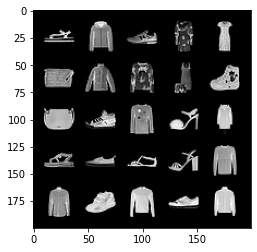

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 47, step 22200: Generator loss: 0.6948951417207715, discriminator loss: 0.6935803756117821


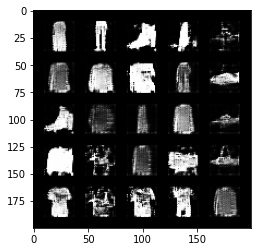

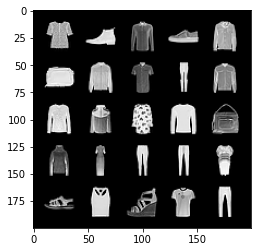

Epoch 47, step 22400: Generator loss: 0.6941930162906643, discriminator loss: 0.6935375165939325


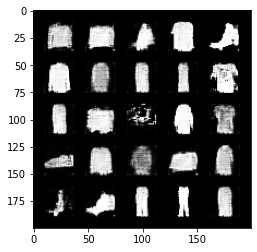

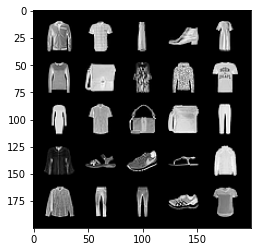

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 48, step 22600: Generator loss: 0.6936682754755018, discriminator loss: 0.693596948683262


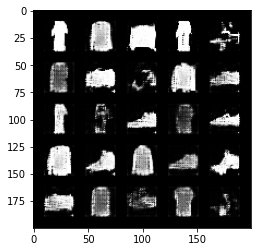

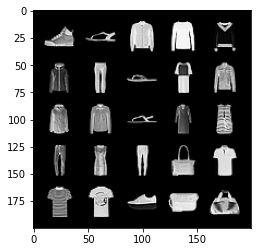

Epoch 48, step 22800: Generator loss: 0.694213348925114, discriminator loss: 0.6935312643647193


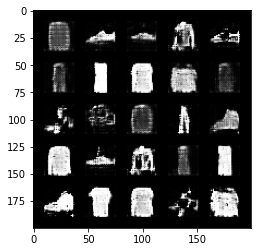

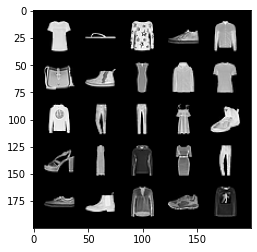

  0%|          | 0/469 [00:00<?, ?it/s]

Epoch 49, step 23000: Generator loss: 0.6944018635153775, discriminator loss: 0.6936142563819886


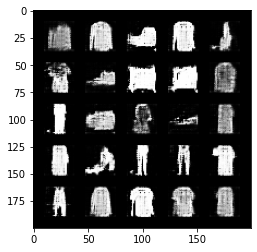

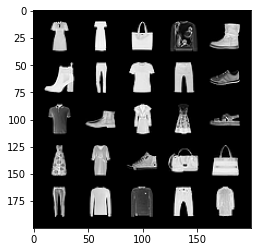

Epoch 49, step 23200: Generator loss: 0.6944888129830357, discriminator loss: 0.6936369809508323


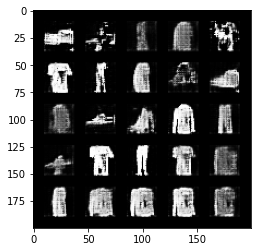

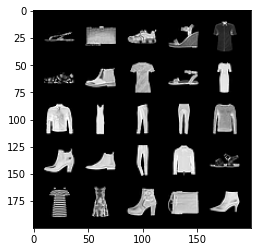

Epoch 49, step 23400: Generator loss: 0.6945855912566185, discriminator loss: 0.6935675206780437


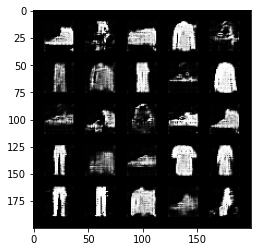

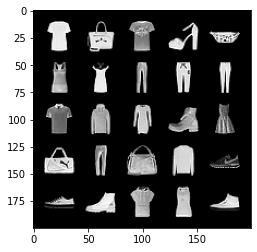

In [52]:
curr_step = 1
n_epochs = 50
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):
    for imgs, labels in tqdm(dataloader):
        curr_batch_size = imgs.shape[0]
        imgs = imgs.to(device)
        
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, imgs, z_dim, curr_batch_size, criterion, get_noise, device)
        mean_discriminator_loss += disc_loss.item() / display_step
        disc_loss.backward(retain_graph = True)
        disc_opt.step()
        
        
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, z_dim, curr_batch_size, criterion, get_noise, device)
        mean_generator_loss += gen_loss.item() / display_step
        gen_loss.backward(retain_graph = True)
        gen_opt.step()
        
        if curr_step % display_step == 0 :
            print(f"Epoch {epoch}, step {curr_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            noise = get_noise(curr_batch_size, z_dim, device)
            fake = gen(noise)
            
            show_tensor_images(fake)
            show_tensor_images(imgs)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        curr_step += 1
            